# Recreation of UNet
It is only for learning purposes: for CNNs and for Pytorch.

In [1]:
import os
import random
from PIL import Image
import torch
from torch import optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.utils.data import random_split
from tqdm import tqdm
from matplotlib import pyplot as plt
from torch.amp import autocast, GradScaler
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.transforms import functional as F
from skimage.measure import label, regionprops
from skimage.morphology import convex_hull_image
import numpy as np
import cv2

print(torch.__version__)          # should show 2.8.0+cu126
print(torch.version.cuda)         # should show '12.6'
print(torch.cuda.is_available())  # should be True
print(torch.cuda.get_device_name(0))  # NVIDIA RTX A6000

2.8.0+cu126
12.6
True
NVIDIA RTX A6000


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
num_workers = 1

if device == "cuda":
    print("Using GPU")
    num_workers = torch.cuda.device_count() * 4
else:
    print("Using CPU")

generator = torch.Generator(device=device)

Using GPU


In [3]:
DATA_DIR = "data/"
DATASET_DIR = DATA_DIR + "optic_disk/"
TRAIN_DIR = DATASET_DIR + "train/"
TRAIN_MASKS_DIR = DATASET_DIR + "train_masks/"
LIMIT = None

STATES_DIR = "states/"
MODEL_PATH = STATES_DIR + "optic_disk_10.pth"
IMAGE_SIZE = 1024

In [4]:
LEARNING_RATE = 1e-3
BATCH_SIZE = 8
EPOCHS = 100

## Dataset
Using Carvana dataset for testing (https://www.kaggle.com/c/carvana-image-masking-challenge)

### Get data

In [5]:
class GetDataset(Dataset):
    def __init__(self, root_path, limit=None):
        self.root_path = root_path
        self.limit = limit
        self.images = sorted([os.path.join(root_path, "train", i)
                              for i in os.listdir(root_path + "train/")])[:self.limit]
        self.masks = sorted([os.path.join(root_path, "train_masks", i)
                             for i in os.listdir(root_path + "train_masks/")])[:self.limit]

        # Basic resize + tensor
        self.base_transform = transforms.Compose([
            transforms.Pad(padding=(0, 0, 1, 1)),
            transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
            transforms.ToTensor(),
        ])

        if self.limit is None:
            self.limit = len(self.images)

    def __getitem__(self, index):
        img = Image.open(self.images[index]).convert("L")
        mask = Image.open(self.masks[index]).convert("L")

        # Apply base transform
        img = self.base_transform(img)
        mask = self.base_transform(mask)

        # Convert mask to binary
        mask = (mask > 0).float()

        return img, mask, self.images[index]

    def __len__(self):
        return min(len(self.images), self.limit)

In [20]:
class AugmentedDataset(Dataset):
    """
    Wraps a base dataset to return:
      - the original image
      - three augmented versions of it
    -> This triples the dataset size.
    """
    def __init__(self, base_dataset, augment=True):
        self.base_dataset = base_dataset
        self.augment = augment

    def __len__(self):
        # Triple the dataset: original + 3 augmentations
        return len(self.base_dataset) * 4

    def __getitem__(self, idx):
        # Map idx to the original dataset
        orig_idx = idx % len(self.base_dataset)
        img, mask, path = self.base_dataset[orig_idx]

        if not self.augment:
            return img, mask, path

        # Case 1: original
        if idx < len(self.base_dataset) or not self.augment:
            return img, mask, path

        # Case 2: first augmentation
        elif idx < 2 * len(self.base_dataset):
            img_aug, mask_aug = self.apply_augmentation(img, mask)
            return img_aug, mask_aug, path + "_aug1"

        # Case 3: second augmentation
        elif idx < 3 * len(self.base_dataset):
            img_aug, mask_aug = self.apply_augmentation(img, mask)
            return img_aug, mask_aug, path + "_aug2"

        # Case 4: third augmentation
        else:
            img_aug, mask_aug = self.apply_augmentation(img, mask)
            return img_aug, mask_aug, path + "_aug3"

    def apply_augmentation(self, img, mask):
        # Convert to PIL if needed
        if not isinstance(img, Image.Image):
            img = transforms.ToPILImage()(img)
        if not isinstance(mask, Image.Image):
            mask = transforms.ToPILImage()(mask)

        # Random rotation between -5 and 5 degrees
        angle = random.uniform(-5, 5)
        img = F.rotate(img, angle)
        mask = F.rotate(mask, angle)

        # Random flips
        if random.random() > 0.5:
            img = F.hflip(img)
            mask = F.hflip(mask)
        if random.random() > 0.5:
            img = F.vflip(img)
            mask = F.vflip(mask)

        # Random zoom / crop
        w, h = img.size

        # Define zoom scale (0.6 = 60% -> crop, 1.0 = full image)
        scale = random.uniform(0.6, 1.0)
        new_w, new_h = int(w * scale), int(h * scale)

        # Random top-left corner for crop
        left = random.randint(0, w - new_w)
        top = random.randint(0, h - new_h)
        img = F.crop(img, top, left, new_h, new_w)
        mask = F.crop(mask, top, left, new_h, new_w)

        # Resize back to original size
        img = F.resize(img, [h, w])
        mask = F.resize(mask, [h, w])

        # Convert back to tensor
        img = transforms.ToTensor()(img)
        mask = transforms.ToTensor()(mask)
        mask = (mask > 0).float()

        return img, mask

In [7]:
def visualize_augmentations(dataset, n=5):
    """
    Visualize original and augmented images and masks from AugmentedDataset.
    Shows overlays for both augmentations.

    Args:
        dataset: instance of AugmentedDataset
        n: number of samples to show
    """
    if not isinstance(dataset, AugmentedDataset):
        raise ValueError("Dataset must be an AugmentedDataset to visualize augmentations")

    base_len = len(dataset.base_dataset)  # original dataset size
    indices = random.sample(range(base_len), n)  # pick from originals

    plt.figure(figsize=(20, n * 3))

    for i, idx in enumerate(indices):
        # Original
        orig_img, orig_mask, _ = dataset[idx]

        # First augmentation
        aug1_img, aug1_mask, _ = dataset[idx + base_len]

        # Second augmentation
        aug2_img, aug2_mask, _ = dataset[idx + 2 * base_len]

        # Convert to numpy
        orig_img = orig_img.squeeze().cpu().numpy()
        orig_mask = orig_mask.squeeze().cpu().numpy()
        aug1_img = aug1_img.squeeze().cpu().numpy()
        aug1_mask = aug1_mask.squeeze().cpu().numpy()
        aug2_img = aug2_img.squeeze().cpu().numpy()
        aug2_mask = aug2_mask.squeeze().cpu().numpy()

        # 1. Original image
        plt.subplot(n, 8, i * 8 + 1)
        plt.imshow(orig_img, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        # 2. Original mask
        plt.subplot(n, 8, i * 8 + 2)
        plt.imshow(orig_mask, cmap="gray")
        plt.title("Original Mask")
        plt.axis("off")

        # 3. Aug1 image
        plt.subplot(n, 8, i * 8 + 3)
        plt.imshow(aug1_img, cmap="gray")
        plt.title("Aug1 Image")
        plt.axis("off")

        # 4. Aug1 mask
        plt.subplot(n, 8, i * 8 + 4)
        plt.imshow(aug1_mask, cmap="gray")
        plt.title("Aug1 Mask")
        plt.axis("off")

        # 5. Aug1 overlay
        plt.subplot(n, 8, i * 8 + 5)
        plt.imshow(aug1_img, cmap="gray")
        plt.imshow(aug1_mask, cmap="Reds", alpha=0.2)
        plt.title("Aug1 Overlay")
        plt.axis("off")

        # 6. Aug2 image
        plt.subplot(n, 8, i * 8 + 6)
        plt.imshow(aug2_img, cmap="gray")
        plt.title("Aug2 Image")
        plt.axis("off")

        # 7. Aug2 mask
        plt.subplot(n, 8, i * 8 + 7)
        plt.imshow(aug2_mask, cmap="gray")
        plt.title("Aug2 Mask")
        plt.axis("off")

        # 8. Aug2 overlay
        plt.subplot(n, 8, i * 8 + 8)
        plt.imshow(aug2_img, cmap="gray")
        plt.imshow(aug2_mask, cmap="Reds", alpha=0.2)
        plt.title("Aug2 Overlay")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

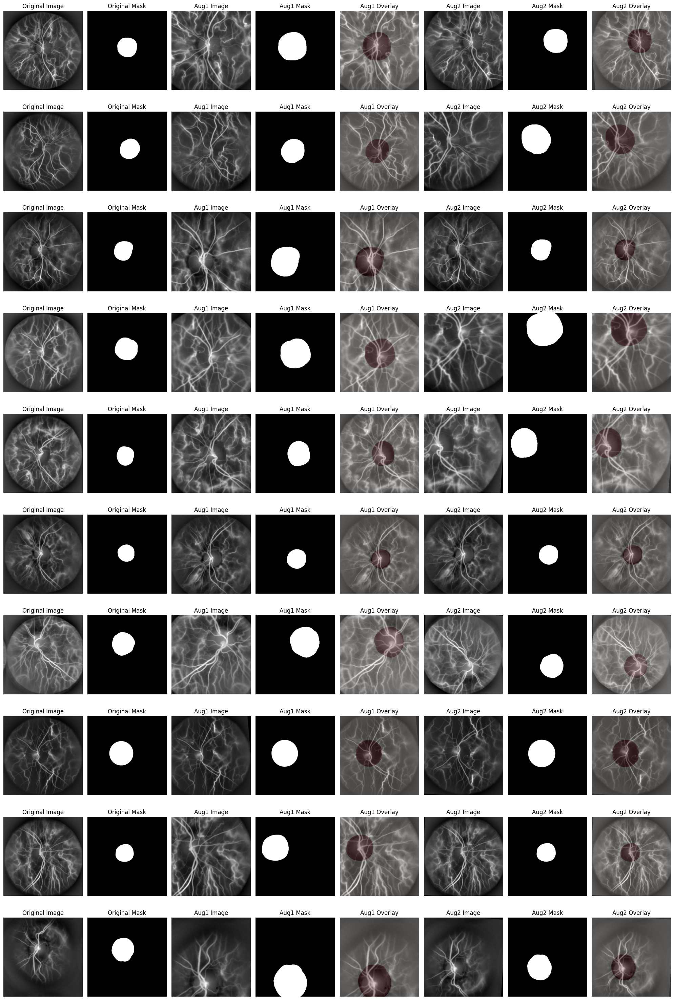

In [24]:
# Create base dataset
base_dataset = GetDataset(DATASET_DIR, LIMIT)

# Wrap with augmented dataset
train_dataset = AugmentedDataset(base_dataset, augment=True)

# Visualize 10 random samples
visualize_augmentations(train_dataset, n=10)

### Split and load it

In [21]:
# Create base dataset
base_dataset = GetDataset(DATASET_DIR, LIMIT)

# Wrap with augmented dataset
train_dataset = AugmentedDataset(base_dataset, augment=True)

# Split into train/test/val
train_dataset, test_dataset = random_split(train_dataset, [0.8, 0.2])
test_dataset, val_dataset = random_split(test_dataset, [0.5, 0.5])

train_dataloader = DataLoader(dataset=train_dataset,
                              num_workers=0, pin_memory=False,
                              batch_size=BATCH_SIZE,
                              shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset,
                            num_workers=0, pin_memory=False,
                            batch_size=BATCH_SIZE,
                            shuffle=True)
test_dataloader = DataLoader(dataset=test_dataset,
                             num_workers=0, pin_memory=False,
                             batch_size=BATCH_SIZE,
                             shuffle=True)

## Cost functions

In [22]:
def dice(prediction, target, threshold=0.5, epsilon=1e-7):
    """
    Compute Dice coefficient for binary masks.
    Works for both single images [1,H,W] or batches [B,1,H,W].

    Args:
        prediction: torch.Tensor, probabilities or logits
        target: torch.Tensor, same shape as prediction, binary mask (0 or 1)
        threshold: threshold to binarize predictions
        epsilon: small value to avoid division by zero

    Returns:
        Dice coefficient (scalar)
    """
    # Convert predictions to binary
    prediction = (prediction > threshold).float()
    target = target.float()

    if prediction.dim() == 4:  # batch mode: [B, 1, H, W]
        intersection = torch.sum(prediction * target, dim=(1, 2, 3))
        union = torch.sum(prediction, dim=(1, 2, 3)) + torch.sum(target, dim=(1, 2, 3))
        dice_score = (2 * intersection + epsilon) / (union + epsilon)
        return dice_score.mean()  # mean over batch
    elif prediction.dim() == 3:  # single image: [1,H,W]
        intersection = torch.sum(prediction * target)
        union = torch.sum(prediction) + torch.sum(target)
        return (2 * intersection + epsilon) / (union + epsilon)
    else:
        raise ValueError(f"Unexpected tensor shape {prediction.shape}. Expected [1,H,W] or [B,1,H,W].")

In [23]:
def dice_loss(pred, target, epsilon=1e-7):
    pred = torch.sigmoid(pred)
    intersection = (pred * target).sum(dim=(1,2,3))
    union = pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    return 1 - ((2 * intersection + epsilon) / (union + epsilon)).mean()

def combined_loss(pred, target):
    bce = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([20.0]).to(device))(pred, target)
    pred_sig = torch.sigmoid(pred)
    intersection = (pred_sig * target).sum()
    dice_loss = 1 - (2 * intersection + 1e-7) / (pred_sig.sum() + target.sum() + 1e-7)
    return bce + dice_loss

In [24]:
def free_cache():
    # release unused CUDA memory
    torch.cuda.empty_cache()

In [25]:
free_cache()

## UResNet

### Model

In [26]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels)
        )

        # To match dimensions for the skip connection if in/out channels differ
        self.shortcut = (
            nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
            if in_channels != out_channels else nn.Identity()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = self.shortcut(x)
        out = self.conv(x)
        out += residual
        return self.relu(out)

In [27]:
class DownResSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DownResSample, self).__init__()
        self.conv = ResBlock(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        y = self.conv(x)
        p = self.pool(y)
        return y, p

In [28]:
class UpResSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpResSample, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = ResBlock(in_channels, out_channels)

    def forward(self, x1, x2):
        x2 = self.up(x2)
        x = torch.cat([x1, x2], dim=1)
        return self.conv(x)

In [29]:
class UResNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(UResNet, self).__init__()
        self.down_conv1 = DownResSample(in_channels, 64)
        self.down_conv2 = DownResSample(64, 128)
        self.down_conv3 = DownResSample(128, 256)
        self.down_conv4 = DownResSample(256, 512)

        self.bottle_neck = ResBlock(512, 1024)

        self.up_conv1 = UpResSample(1024, 512)
        self.up_conv2 = UpResSample(512, 256)
        self.up_conv3 = UpResSample(256, 128)
        self.up_conv4 = UpResSample(128, 64)

        self.out = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        s1, down1 = self.down_conv1(x)
        s2, down2 = self.down_conv2(down1)
        s3, down3 = self.down_conv3(down2)
        s4, down4 = self.down_conv4(down3)

        b = self.bottle_neck(down4)

        up1 = self.up_conv1(s4, b)
        up2 = self.up_conv2(s3, up1)
        up3 = self.up_conv3(s2, up2)
        up4 = self.up_conv4(s1, up3)

        return self.out(up4)

In [30]:
def load_model(path=MODEL_PATH):
    m = UResNet(in_channels=1, num_classes=1).to(device)
    m.load_state_dict(torch.load(path, map_location=torch.device(device)))
    return m

### Train

In [31]:
def train_uresnet(model, train_dataloader, val_dataloader, optimizer, combined_loss, dice,
                  device, epochs=20, save=True, path="best_model.pth",
                  use_scheduler=True):
    t_losses, t_dcs, v_losses, v_dcs = [], [], [], []

    scaler = GradScaler(device)
    best_val_dc = -1.0
    best_epoch = -1

    # ---------------- Scheduler ----------------
    scheduler = None
    if use_scheduler:
        scheduler = ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=10)

    for epoch in range(epochs):
        # ---------------- TRAIN ----------------
        model.train()
        train_running_loss, train_running_dc = 0.0, 0.0

        for idx, (img, mask, _) in enumerate(tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epochs} [Train]")):
            img = img.float().to(device)      # [B,1,H,W]
            mask = mask.float().to(device)    # [B,1,H,W]

            optimizer.zero_grad()

            with autocast(device):  # mixed precision
                y_pred = model(img)
                loss = combined_loss(y_pred, mask)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # Dice for monitoring
            with torch.no_grad():
                dc = dice(y_pred, mask)

            train_running_loss += loss.item()
            train_running_dc += dc.item()

        train_loss = train_running_loss / (idx + 1)
        train_dc = train_running_dc / (idx + 1)
        t_losses.append(train_loss)
        t_dcs.append(train_dc)

        # ---------------- VALIDATION ----------------
        model.eval()
        val_running_loss, val_running_dc = 0.0, 0.0

        with torch.no_grad():
            for idx, (img, mask, _) in enumerate(tqdm(val_dataloader, desc=f"Epoch {epoch+1}/{epochs} [Val]")):
                img = img.float().to(device)
                mask = mask.float().to(device)

                with autocast(device):
                    y_pred = model(img)
                    loss = combined_loss(y_pred, mask)

                dc = dice(y_pred, mask)

                val_running_loss += loss.item()
                val_running_dc += dc.item()

            val_loss = val_running_loss / (idx + 1)
            val_dc = val_running_dc / (idx + 1)
            v_losses.append(val_loss)
            v_dcs.append(val_dc)

        # ---------------- Scheduler Step ----------------
        if scheduler:
            scheduler.step(val_dc)  # because we want to maximize Dice

        # ---------------- LOGGING ----------------
        current_lr = optimizer.param_groups[0]['lr']
        print("-" * 40)
        print(f"Epoch {epoch+1}/{epochs} | LR: {current_lr:e}")
        print(f" Train Loss: {train_loss:.4f} | Train Dice: {train_dc:.4f}")
        print(f" Val Loss:   {val_loss:.4f} | Val Dice:   {val_dc:.4f}")
        print("-" * 40)

        # ---------------- CHECKPOINT ----------------
        if save and val_dc > best_val_dc:
            best_val_dc = val_dc
            best_epoch = epoch + 1
            torch.save(model.state_dict(), path)
            print(f"✅ New best model saved at epoch {best_epoch} with Dice {best_val_dc:.4f}")

    # ---------------- LOAD BEST ----------------
    if save and best_epoch > 0:
        model.load_state_dict(torch.load(path, map_location=device))
        print(f"🎯 Loaded best model from epoch {best_epoch} (Dice {best_val_dc:.4f})")

    return t_losses, t_dcs, v_losses, v_dcs

In [32]:
model = None
if True: # Create new model or continue train existent one
    model = UResNet(in_channels=1, num_classes=1).to(device)
else:
    #LEARNING_RATE = 8e-5
    model = load_model(MODEL_PATH)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

free_cache()
t_losses, t_dcs, v_losses, v_dcs = train_uresnet(
    model=model,
    train_dataloader=train_dataloader,
    val_dataloader=val_dataloader,
    optimizer=optimizer,
    combined_loss=combined_loss,
    dice=dice,
    device=device,
    epochs=EPOCHS,
    save=True,
    path=MODEL_PATH,
    use_scheduler=True
)
free_cache()

Epoch 1/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 1/100 | LR: 1.000000e-03
 Train Loss: 1.3060 | Train Dice: 0.6047
 Val Loss:   1.4052 | Val Dice:   0.5008
----------------------------------------
✅ New best model saved at epoch 1 with Dice 0.5008


Epoch 2/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 2/100 | LR: 1.000000e-03
 Train Loss: 0.7847 | Train Dice: 0.7684
 Val Loss:   0.9601 | Val Dice:   0.7050
----------------------------------------
✅ New best model saved at epoch 2 with Dice 0.7050


Epoch 3/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 3/100 | LR: 1.000000e-03
 Train Loss: 0.5920 | Train Dice: 0.8195
 Val Loss:   0.6824 | Val Dice:   0.7969
----------------------------------------
✅ New best model saved at epoch 3 with Dice 0.7969


Epoch 4/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.37it/s]


----------------------------------------
Epoch 4/100 | LR: 1.000000e-03
 Train Loss: 0.5038 | Train Dice: 0.8425
 Val Loss:   0.6099 | Val Dice:   0.8460
----------------------------------------
✅ New best model saved at epoch 4 with Dice 0.8460


Epoch 5/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 5/100 | LR: 1.000000e-03
 Train Loss: 0.4169 | Train Dice: 0.8612
 Val Loss:   0.4985 | Val Dice:   0.8252
----------------------------------------


Epoch 6/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 6/100 | LR: 1.000000e-03
 Train Loss: 0.3904 | Train Dice: 0.8703
 Val Loss:   0.6061 | Val Dice:   0.7888
----------------------------------------


Epoch 7/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 7/100 | LR: 1.000000e-03
 Train Loss: 0.3799 | Train Dice: 0.8733
 Val Loss:   0.5145 | Val Dice:   0.8891
----------------------------------------
✅ New best model saved at epoch 7 with Dice 0.8891


Epoch 8/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 8/100 | LR: 1.000000e-03
 Train Loss: 0.3445 | Train Dice: 0.8831
 Val Loss:   0.3931 | Val Dice:   0.8510
----------------------------------------


Epoch 9/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 9/100 | LR: 1.000000e-03
 Train Loss: 0.3181 | Train Dice: 0.8879
 Val Loss:   0.3457 | Val Dice:   0.9020
----------------------------------------
✅ New best model saved at epoch 9 with Dice 0.9020


Epoch 10/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 10/100 | LR: 1.000000e-03
 Train Loss: 0.3019 | Train Dice: 0.8926
 Val Loss:   0.5954 | Val Dice:   0.8062
----------------------------------------


Epoch 11/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 11/100 | LR: 1.000000e-03
 Train Loss: 0.3024 | Train Dice: 0.8929
 Val Loss:   0.3265 | Val Dice:   0.9047
----------------------------------------
✅ New best model saved at epoch 11 with Dice 0.9047


Epoch 12/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 12/100 | LR: 1.000000e-03
 Train Loss: 0.2690 | Train Dice: 0.8994
 Val Loss:   0.6600 | Val Dice:   0.8433
----------------------------------------


Epoch 13/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 13/100 | LR: 1.000000e-03
 Train Loss: 0.2637 | Train Dice: 0.9019
 Val Loss:   0.4172 | Val Dice:   0.9015
----------------------------------------


Epoch 14/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 14/100 | LR: 1.000000e-03
 Train Loss: 0.2635 | Train Dice: 0.9026
 Val Loss:   1.6333 | Val Dice:   0.7682
----------------------------------------


Epoch 15/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 15/100 | LR: 1.000000e-03
 Train Loss: 0.2478 | Train Dice: 0.9067
 Val Loss:   0.3789 | Val Dice:   0.8640
----------------------------------------


Epoch 16/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.36it/s]


----------------------------------------
Epoch 16/100 | LR: 1.000000e-03
 Train Loss: 0.2354 | Train Dice: 0.9084
 Val Loss:   0.2675 | Val Dice:   0.9044
----------------------------------------


Epoch 17/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.37it/s]


----------------------------------------
Epoch 17/100 | LR: 1.000000e-03
 Train Loss: 0.2287 | Train Dice: 0.9114
 Val Loss:   0.4197 | Val Dice:   0.9115
----------------------------------------
✅ New best model saved at epoch 17 with Dice 0.9115


Epoch 18/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 18/100 | LR: 1.000000e-03
 Train Loss: 0.2520 | Train Dice: 0.9061
 Val Loss:   0.3349 | Val Dice:   0.9002
----------------------------------------


Epoch 19/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 19/100 | LR: 1.000000e-03
 Train Loss: 0.2185 | Train Dice: 0.9147
 Val Loss:   0.3770 | Val Dice:   0.8815
----------------------------------------


Epoch 20/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 20/100 | LR: 1.000000e-03
 Train Loss: 0.2138 | Train Dice: 0.9150
 Val Loss:   0.2725 | Val Dice:   0.8930
----------------------------------------


Epoch 21/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 21/100 | LR: 1.000000e-03
 Train Loss: 0.1980 | Train Dice: 0.9202
 Val Loss:   0.3018 | Val Dice:   0.9131
----------------------------------------
✅ New best model saved at epoch 21 with Dice 0.9131


Epoch 22/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 22/100 | LR: 1.000000e-03
 Train Loss: 0.2070 | Train Dice: 0.9178
 Val Loss:   0.2162 | Val Dice:   0.9205
----------------------------------------
✅ New best model saved at epoch 22 with Dice 0.9205


Epoch 23/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 23/100 | LR: 1.000000e-03
 Train Loss: 0.1970 | Train Dice: 0.9195
 Val Loss:   0.2784 | Val Dice:   0.9212
----------------------------------------
✅ New best model saved at epoch 23 with Dice 0.9212


Epoch 24/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 24/100 | LR: 1.000000e-03
 Train Loss: 0.1839 | Train Dice: 0.9236
 Val Loss:   0.2187 | Val Dice:   0.9246
----------------------------------------
✅ New best model saved at epoch 24 with Dice 0.9246


Epoch 25/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 25/100 | LR: 1.000000e-03
 Train Loss: 0.1852 | Train Dice: 0.9231
 Val Loss:   0.2486 | Val Dice:   0.9194
----------------------------------------


Epoch 26/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 26/100 | LR: 1.000000e-03
 Train Loss: 0.2005 | Train Dice: 0.9188
 Val Loss:   0.6926 | Val Dice:   0.8886
----------------------------------------


Epoch 27/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 27/100 | LR: 1.000000e-03
 Train Loss: 0.1835 | Train Dice: 0.9240
 Val Loss:   0.2340 | Val Dice:   0.9133
----------------------------------------


Epoch 28/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 28/100 | LR: 1.000000e-03
 Train Loss: 0.1731 | Train Dice: 0.9259
 Val Loss:   0.2150 | Val Dice:   0.9205
----------------------------------------


Epoch 29/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 29/100 | LR: 1.000000e-03
 Train Loss: 0.1661 | Train Dice: 0.9280
 Val Loss:   0.5710 | Val Dice:   0.8890
----------------------------------------


Epoch 30/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 30/100 | LR: 1.000000e-03
 Train Loss: 0.1691 | Train Dice: 0.9285
 Val Loss:   0.2702 | Val Dice:   0.9108
----------------------------------------


Epoch 31/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 31/100 | LR: 1.000000e-03
 Train Loss: 0.1652 | Train Dice: 0.9288
 Val Loss:   1.1078 | Val Dice:   0.8223
----------------------------------------


Epoch 32/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 32/100 | LR: 1.000000e-03
 Train Loss: 0.1696 | Train Dice: 0.9284
 Val Loss:   0.1904 | Val Dice:   0.9272
----------------------------------------
✅ New best model saved at epoch 32 with Dice 0.9272


Epoch 33/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 33/100 | LR: 1.000000e-03
 Train Loss: 0.1591 | Train Dice: 0.9323
 Val Loss:   0.2750 | Val Dice:   0.9120
----------------------------------------


Epoch 34/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 34/100 | LR: 1.000000e-03
 Train Loss: 0.1506 | Train Dice: 0.9338
 Val Loss:   0.1810 | Val Dice:   0.9263
----------------------------------------


Epoch 35/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 35/100 | LR: 1.000000e-03
 Train Loss: 0.1664 | Train Dice: 0.9298
 Val Loss:   0.7204 | Val Dice:   0.8786
----------------------------------------


Epoch 36/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 36/100 | LR: 1.000000e-03
 Train Loss: 0.1586 | Train Dice: 0.9325
 Val Loss:   0.1841 | Val Dice:   0.9312
----------------------------------------
✅ New best model saved at epoch 36 with Dice 0.9312


Epoch 37/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 37/100 | LR: 1.000000e-03
 Train Loss: 0.1572 | Train Dice: 0.9330
 Val Loss:   0.2475 | Val Dice:   0.9137
----------------------------------------


Epoch 38/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 38/100 | LR: 1.000000e-03
 Train Loss: 0.1437 | Train Dice: 0.9361
 Val Loss:   0.1797 | Val Dice:   0.9348
----------------------------------------
✅ New best model saved at epoch 38 with Dice 0.9348


Epoch 39/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 39/100 | LR: 1.000000e-03
 Train Loss: 0.1477 | Train Dice: 0.9355
 Val Loss:   0.1655 | Val Dice:   0.9311
----------------------------------------


Epoch 40/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 40/100 | LR: 1.000000e-03
 Train Loss: 0.1558 | Train Dice: 0.9344
 Val Loss:   0.7612 | Val Dice:   0.8758
----------------------------------------


Epoch 41/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 41/100 | LR: 1.000000e-03
 Train Loss: 0.1402 | Train Dice: 0.9375
 Val Loss:   0.3189 | Val Dice:   0.9204
----------------------------------------


Epoch 42/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 42/100 | LR: 1.000000e-03
 Train Loss: 0.1473 | Train Dice: 0.9371
 Val Loss:   0.7189 | Val Dice:   0.8895
----------------------------------------


Epoch 43/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 43/100 | LR: 1.000000e-03
 Train Loss: 0.1425 | Train Dice: 0.9376
 Val Loss:   0.1679 | Val Dice:   0.9394
----------------------------------------
✅ New best model saved at epoch 43 with Dice 0.9394


Epoch 44/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 44/100 | LR: 1.000000e-03
 Train Loss: 0.1362 | Train Dice: 0.9389
 Val Loss:   0.1626 | Val Dice:   0.9343
----------------------------------------


Epoch 45/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 45/100 | LR: 1.000000e-03
 Train Loss: 0.1393 | Train Dice: 0.9391
 Val Loss:   0.2245 | Val Dice:   0.9268
----------------------------------------


Epoch 46/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 46/100 | LR: 1.000000e-03
 Train Loss: 0.1336 | Train Dice: 0.9403
 Val Loss:   0.1678 | Val Dice:   0.9398
----------------------------------------
✅ New best model saved at epoch 46 with Dice 0.9398


Epoch 47/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 47/100 | LR: 1.000000e-03
 Train Loss: 0.1352 | Train Dice: 0.9397
 Val Loss:   0.1742 | Val Dice:   0.9405
----------------------------------------
✅ New best model saved at epoch 47 with Dice 0.9405


Epoch 48/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 48/100 | LR: 1.000000e-03
 Train Loss: 0.1363 | Train Dice: 0.9393
 Val Loss:   0.1611 | Val Dice:   0.9368
----------------------------------------


Epoch 49/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 49/100 | LR: 1.000000e-03
 Train Loss: 0.1341 | Train Dice: 0.9407
 Val Loss:   0.2866 | Val Dice:   0.9186
----------------------------------------


Epoch 50/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 50/100 | LR: 1.000000e-03
 Train Loss: 0.1396 | Train Dice: 0.9396
 Val Loss:   0.1645 | Val Dice:   0.9316
----------------------------------------


Epoch 51/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 51/100 | LR: 1.000000e-03
 Train Loss: 0.1361 | Train Dice: 0.9409
 Val Loss:   0.3656 | Val Dice:   0.9164
----------------------------------------


Epoch 52/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 52/100 | LR: 1.000000e-03
 Train Loss: 0.1266 | Train Dice: 0.9429
 Val Loss:   0.1571 | Val Dice:   0.9409
----------------------------------------
✅ New best model saved at epoch 52 with Dice 0.9409


Epoch 53/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 53/100 | LR: 1.000000e-03
 Train Loss: 0.1300 | Train Dice: 0.9412
 Val Loss:   0.1847 | Val Dice:   0.9405
----------------------------------------


Epoch 54/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 54/100 | LR: 1.000000e-03
 Train Loss: 0.1205 | Train Dice: 0.9462
 Val Loss:   0.2509 | Val Dice:   0.9273
----------------------------------------


Epoch 55/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 55/100 | LR: 1.000000e-03
 Train Loss: 0.1209 | Train Dice: 0.9451
 Val Loss:   0.1589 | Val Dice:   0.9379
----------------------------------------


Epoch 56/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 56/100 | LR: 1.000000e-03
 Train Loss: 0.1178 | Train Dice: 0.9462
 Val Loss:   0.1389 | Val Dice:   0.9368
----------------------------------------


Epoch 57/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 57/100 | LR: 1.000000e-03
 Train Loss: 0.1153 | Train Dice: 0.9472
 Val Loss:   0.1632 | Val Dice:   0.9399
----------------------------------------


Epoch 58/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 58/100 | LR: 1.000000e-03
 Train Loss: 0.1184 | Train Dice: 0.9460
 Val Loss:   0.1419 | Val Dice:   0.9456
----------------------------------------
✅ New best model saved at epoch 58 with Dice 0.9456


Epoch 59/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 59/100 | LR: 1.000000e-03
 Train Loss: 0.1194 | Train Dice: 0.9466
 Val Loss:   0.1637 | Val Dice:   0.9419
----------------------------------------


Epoch 60/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.38it/s]


----------------------------------------
Epoch 60/100 | LR: 1.000000e-03
 Train Loss: 0.1359 | Train Dice: 0.9416
 Val Loss:   0.5854 | Val Dice:   0.9130
----------------------------------------


Epoch 61/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 61/100 | LR: 1.000000e-03
 Train Loss: 0.1202 | Train Dice: 0.9464
 Val Loss:   5.0031 | Val Dice:   0.5731
----------------------------------------


Epoch 62/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 62/100 | LR: 1.000000e-03
 Train Loss: 0.1127 | Train Dice: 0.9486
 Val Loss:   0.1554 | Val Dice:   0.9403
----------------------------------------


Epoch 63/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 63/100 | LR: 1.000000e-03
 Train Loss: 0.1158 | Train Dice: 0.9478
 Val Loss:   0.1528 | Val Dice:   0.9354
----------------------------------------


Epoch 64/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 64/100 | LR: 1.000000e-03
 Train Loss: 0.1109 | Train Dice: 0.9491
 Val Loss:   0.1954 | Val Dice:   0.9414
----------------------------------------


Epoch 65/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 65/100 | LR: 1.000000e-03
 Train Loss: 0.1225 | Train Dice: 0.9458
 Val Loss:   0.1364 | Val Dice:   0.9374
----------------------------------------


Epoch 66/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 66/100 | LR: 1.000000e-03
 Train Loss: 0.1285 | Train Dice: 0.9444
 Val Loss:   0.1730 | Val Dice:   0.9329
----------------------------------------


Epoch 67/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 67/100 | LR: 1.000000e-03
 Train Loss: 0.1065 | Train Dice: 0.9511
 Val Loss:   0.1337 | Val Dice:   0.9434
----------------------------------------


Epoch 68/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 68/100 | LR: 1.000000e-03
 Train Loss: 0.1116 | Train Dice: 0.9493
 Val Loss:   0.7156 | Val Dice:   0.8407
----------------------------------------


Epoch 69/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 69/100 | LR: 5.000000e-04
 Train Loss: 0.1140 | Train Dice: 0.9490
 Val Loss:   0.2220 | Val Dice:   0.9412
----------------------------------------


Epoch 70/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 70/100 | LR: 5.000000e-04
 Train Loss: 0.0983 | Train Dice: 0.9544
 Val Loss:   0.1418 | Val Dice:   0.9476
----------------------------------------
✅ New best model saved at epoch 70 with Dice 0.9476


Epoch 71/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 71/100 | LR: 5.000000e-04
 Train Loss: 0.0981 | Train Dice: 0.9541
 Val Loss:   0.1517 | Val Dice:   0.9441
----------------------------------------


Epoch 72/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 72/100 | LR: 5.000000e-04
 Train Loss: 0.0928 | Train Dice: 0.9572
 Val Loss:   0.1529 | Val Dice:   0.9467
----------------------------------------


Epoch 73/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 73/100 | LR: 5.000000e-04
 Train Loss: 0.0948 | Train Dice: 0.9562
 Val Loss:   0.1396 | Val Dice:   0.9489
----------------------------------------
✅ New best model saved at epoch 73 with Dice 0.9489


Epoch 74/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 74/100 | LR: 5.000000e-04
 Train Loss: 0.0928 | Train Dice: 0.9577
 Val Loss:   0.3271 | Val Dice:   0.9254
----------------------------------------


Epoch 75/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 75/100 | LR: 5.000000e-04
 Train Loss: 0.0904 | Train Dice: 0.9576
 Val Loss:   0.1210 | Val Dice:   0.9503
----------------------------------------
✅ New best model saved at epoch 75 with Dice 0.9503


Epoch 76/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 76/100 | LR: 5.000000e-04
 Train Loss: 0.0875 | Train Dice: 0.9584
 Val Loss:   0.1183 | Val Dice:   0.9491
----------------------------------------


Epoch 77/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 77/100 | LR: 5.000000e-04
 Train Loss: 0.0915 | Train Dice: 0.9577
 Val Loss:   0.1803 | Val Dice:   0.9448
----------------------------------------


Epoch 78/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 78/100 | LR: 5.000000e-04
 Train Loss: 0.0878 | Train Dice: 0.9591
 Val Loss:   0.1829 | Val Dice:   0.9455
----------------------------------------


Epoch 79/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 79/100 | LR: 5.000000e-04
 Train Loss: 0.0886 | Train Dice: 0.9594
 Val Loss:   0.1326 | Val Dice:   0.9485
----------------------------------------


Epoch 80/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 80/100 | LR: 5.000000e-04
 Train Loss: 0.0875 | Train Dice: 0.9596
 Val Loss:   0.1098 | Val Dice:   0.9533
----------------------------------------
✅ New best model saved at epoch 80 with Dice 0.9533


Epoch 81/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 81/100 | LR: 5.000000e-04
 Train Loss: 0.0849 | Train Dice: 0.9599
 Val Loss:   0.1441 | Val Dice:   0.9508
----------------------------------------


Epoch 82/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 82/100 | LR: 5.000000e-04
 Train Loss: 0.0850 | Train Dice: 0.9598
 Val Loss:   0.1215 | Val Dice:   0.9529
----------------------------------------


Epoch 83/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 83/100 | LR: 5.000000e-04
 Train Loss: 0.0846 | Train Dice: 0.9610
 Val Loss:   0.1194 | Val Dice:   0.9522
----------------------------------------


Epoch 84/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 84/100 | LR: 5.000000e-04
 Train Loss: 0.0840 | Train Dice: 0.9614
 Val Loss:   0.1173 | Val Dice:   0.9531
----------------------------------------


Epoch 85/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 85/100 | LR: 5.000000e-04
 Train Loss: 0.0821 | Train Dice: 0.9614
 Val Loss:   0.1345 | Val Dice:   0.9495
----------------------------------------


Epoch 86/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 86/100 | LR: 5.000000e-04
 Train Loss: 0.0802 | Train Dice: 0.9617
 Val Loss:   0.1309 | Val Dice:   0.9550
----------------------------------------
✅ New best model saved at epoch 86 with Dice 0.9550


Epoch 87/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 87/100 | LR: 5.000000e-04
 Train Loss: 0.0877 | Train Dice: 0.9606
 Val Loss:   4.6599 | Val Dice:   0.4703
----------------------------------------


Epoch 88/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 88/100 | LR: 5.000000e-04
 Train Loss: 0.0877 | Train Dice: 0.9605
 Val Loss:   0.1122 | Val Dice:   0.9526
----------------------------------------


Epoch 89/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 89/100 | LR: 5.000000e-04
 Train Loss: 0.0834 | Train Dice: 0.9612
 Val Loss:   0.1125 | Val Dice:   0.9560
----------------------------------------
✅ New best model saved at epoch 89 with Dice 0.9560


Epoch 90/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 90/100 | LR: 5.000000e-04
 Train Loss: 0.0805 | Train Dice: 0.9623
 Val Loss:   0.1170 | Val Dice:   0.9533
----------------------------------------


Epoch 91/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 91/100 | LR: 5.000000e-04
 Train Loss: 0.0780 | Train Dice: 0.9638
 Val Loss:   0.1055 | Val Dice:   0.9563
----------------------------------------
✅ New best model saved at epoch 91 with Dice 0.9563


Epoch 92/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 92/100 | LR: 5.000000e-04
 Train Loss: 0.0792 | Train Dice: 0.9629
 Val Loss:   0.1143 | Val Dice:   0.9550
----------------------------------------


Epoch 93/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 93/100 | LR: 5.000000e-04
 Train Loss: 0.0791 | Train Dice: 0.9633
 Val Loss:   0.1425 | Val Dice:   0.9545
----------------------------------------


Epoch 94/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 94/100 | LR: 5.000000e-04
 Train Loss: 0.0785 | Train Dice: 0.9630
 Val Loss:   0.1411 | Val Dice:   0.9536
----------------------------------------


Epoch 95/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 95/100 | LR: 5.000000e-04
 Train Loss: 0.0779 | Train Dice: 0.9630
 Val Loss:   0.1995 | Val Dice:   0.9357
----------------------------------------


Epoch 96/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 96/100 | LR: 5.000000e-04
 Train Loss: 0.0766 | Train Dice: 0.9642
 Val Loss:   0.1151 | Val Dice:   0.9552
----------------------------------------


Epoch 97/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 97/100 | LR: 5.000000e-04
 Train Loss: 0.0801 | Train Dice: 0.9640
 Val Loss:   0.1174 | Val Dice:   0.9542
----------------------------------------


Epoch 98/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 98/100 | LR: 5.000000e-04
 Train Loss: 0.0752 | Train Dice: 0.9648
 Val Loss:   0.0977 | Val Dice:   0.9571
----------------------------------------
✅ New best model saved at epoch 98 with Dice 0.9571


Epoch 99/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.40it/s]


----------------------------------------
Epoch 99/100 | LR: 5.000000e-04
 Train Loss: 0.0746 | Train Dice: 0.9655
 Val Loss:   0.1067 | Val Dice:   0.9562
----------------------------------------


Epoch 100/100 [Val]: 100%|██████████| 41/41 [00:17<00:00,  2.39it/s]


----------------------------------------
Epoch 100/100 | LR: 5.000000e-04
 Train Loss: 0.0744 | Train Dice: 0.9645
 Val Loss:   0.1034 | Val Dice:   0.9584
----------------------------------------
✅ New best model saved at epoch 100 with Dice 0.9584
🎯 Loaded best model from epoch 100 (Dice 0.9584)


In [33]:
# ✅ New best model saved at epoch 60 with Dice 0.9412 (numero 9)
free_cache()

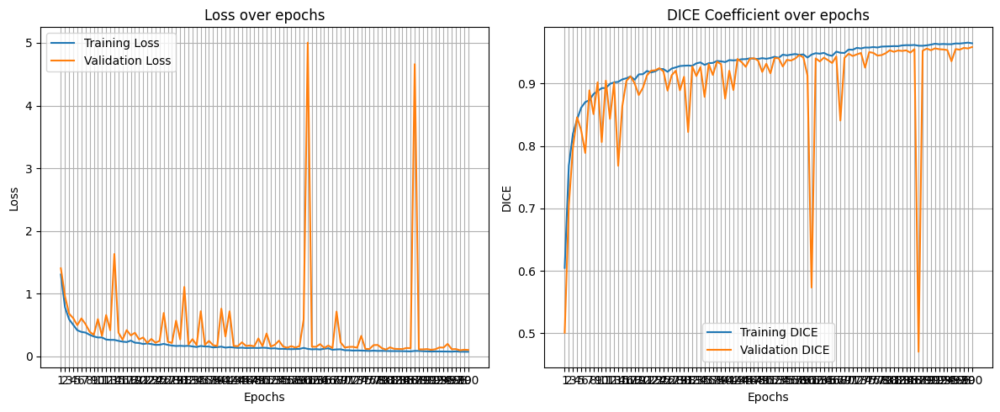

In [34]:
epochs_list = list(range(1, len(t_losses) + 1))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_list, t_losses, label='Training Loss')
plt.plot(epochs_list, v_losses, label='Validation Loss')
plt.xticks(ticks=list(range(1, len(t_losses) + 1, 1)))
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.tight_layout()

plt.legend()


plt.subplot(1, 2, 2)
plt.plot(epochs_list, t_dcs, label='Training DICE')
plt.plot(epochs_list, v_dcs, label='Validation DICE')
plt.xticks(ticks=list(range(1, len(t_losses) + 1, 1)))
plt.title('DICE Coefficient over epochs')
plt.xlabel('Epochs')
plt.ylabel('DICE')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

In [35]:
trained_model = load_model(MODEL_PATH)

In [36]:
test_running_loss = 0
test_running_dc = 0

with torch.no_grad():
    i = 0
    for _, img_mask in enumerate(tqdm(test_dataloader, position=0, leave=True)):
        img = img_mask[0].float().to(device)
        mask = img_mask[1].float().to(device)

        y_pred = trained_model(img)
        loss = combined_loss(y_pred, mask)
        dc = dice(y_pred, mask)

        test_running_loss += loss.item()
        test_running_dc += dc.item()
        i += 1

    test_loss = test_running_loss / i
    test_dc = test_running_dc / i

print(f'Loss: {test_loss:.4f}, DICE: {test_dc:.4f}')

100%|██████████| 41/41 [00:28<00:00,  1.44it/s]

Loss: 0.0988, DICE: 0.9559


In [37]:
n = 10

image_tensors = []
mask_tensors = []
image_paths = []

for _ in range(n):
    random_index = random.randint(0, len(test_dataloader.dataset) - 1)
    random_sample = test_dataloader.dataset[random_index]

    image_tensors.append(random_sample[0])
    mask_tensors.append(random_sample[1])
    image_paths.append(random_sample[2])

In [38]:
def res_random_images_inference(image_tensors, mask_tensors, image_paths, model_pth, device):
    """
    Show original images, ground truth masks, and model predictions.

    Args:
        image_tensors: list of torch tensors [C,H,W] or [1,H,W]
        mask_tensors: list of torch tensors [1,H,W]
        image_paths: list of image file paths (for titles)
        model_pth: path to saved model weights
        device: 'cuda' or 'cpu'
    """
    # Make sure model is instantiated
    model = UResNet(in_channels=1, num_classes=1).to(device)
    model.load_state_dict(torch.load(model_pth, map_location=device))
    model.eval()

    n = len(image_tensors)
    plt.figure(figsize=(12, 4 * n))

    with torch.no_grad():
        for i in range(n):
            img = image_tensors[i].unsqueeze(0).float().to(device)  # [1,1,H,W]
            mask = mask_tensors[i].cpu().squeeze().numpy()           # [H,W]

            # Forward pass
            pred = model(img)
            pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()  # [H,W], probs

            # Threshold to binary mask
            pred_mask_bin = (pred_mask > 0.5).astype(float)

            # Original image for plotting
            orig_img = img.cpu().squeeze().numpy()  # [H,W]

            # Plot
            plt.subplot(n, 3, i * 3 + 1)
            plt.imshow(orig_img, cmap='gray')
            plt.title(f"Original\n{image_paths[i].split('/')[-1]}")
            plt.axis('off')

            plt.subplot(n, 3, i * 3 + 2)
            plt.imshow(mask, cmap='gray')
            plt.title("Ground Truth Mask")
            plt.axis('off')

            plt.subplot(n, 3, i * 3 + 3)
            plt.imshow(pred_mask_bin, cmap='gray')
            plt.title(f"Predicted Mask\nDICE: {dice(torch.tensor(pred_mask_bin).unsqueeze(0),
                                        torch.tensor(mask).unsqueeze(0)):.4f}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

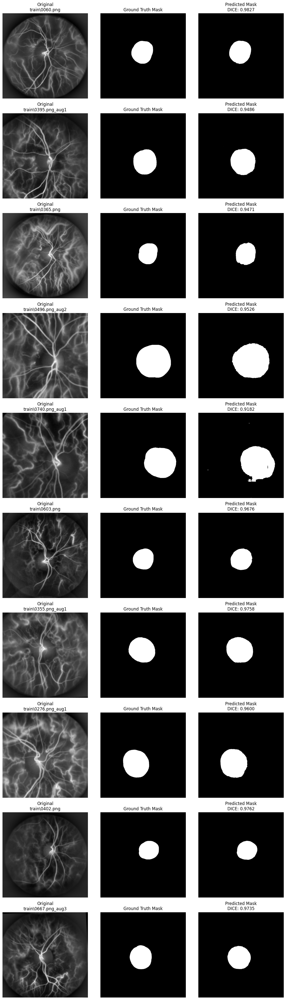

In [39]:
res_random_images_inference(image_tensors, mask_tensors, image_paths, MODEL_PATH, device)

In [40]:
def get_best_worst_samples(model, dataloaders, device, dice, n=10):
    """
    Evaluate model across multiple dataloaders (train, val, test, ...).
    Returns best/worst n samples globally based on Dice.

    Args:
        model: trained model
        dataloaders: list of dataloaders [train_dataloader, val_dataloader, test_dataloader]
        device: torch.device
        dice: function to compute dice score
        n: number of best/worst samples to return
    """
    model.eval()
    results = []  # will hold (dice_score, img, mask, path)

    with torch.no_grad():
        for loader in dataloaders:
            for img, mask, paths in tqdm(loader, desc="Evaluating"):
                img = img.float().to(device)
                mask = mask.float().to(device)

                y_pred = model(img)

                for b in range(img.size(0)):
                    dc_val = dice(y_pred[b:b+1], mask[b:b+1]).item()
                    results.append((dc_val, img[b].cpu(), mask[b].cpu(), paths[b]))

    # Sort by dice (ascending = worst first)
    results_sorted = sorted(results, key=lambda x: x[0])

    # Worst n
    worst_samples = results_sorted[:n]
    worst_image_tensors = [x[1] for x in worst_samples]
    worst_mask_tensors = [x[2] for x in worst_samples]
    worst_image_paths = [x[3] for x in worst_samples]

    # Best n
    best_samples = results_sorted[-n:][::-1]
    best_image_tensors = [x[1] for x in best_samples]
    best_mask_tensors = [x[2] for x in best_samples]
    best_image_paths = [x[3] for x in best_samples]

    return (
        worst_image_tensors,
        worst_mask_tensors,
        worst_image_paths,
        best_image_tensors,
        best_mask_tensors,
        best_image_paths,
    )

In [41]:
(
    worst_imgs,
    worst_masks,
    worst_paths,
    best_imgs,
    best_masks,
    best_paths,
) = get_best_worst_samples(trained_model,
                           [train_dataloader, val_dataloader, test_dataloader],
                           device,
                           dice,
                           n=10)

Evaluating: 100%|██████████| 41/41 [00:27<00:00,  1.49it/s]


Worst samples paths:


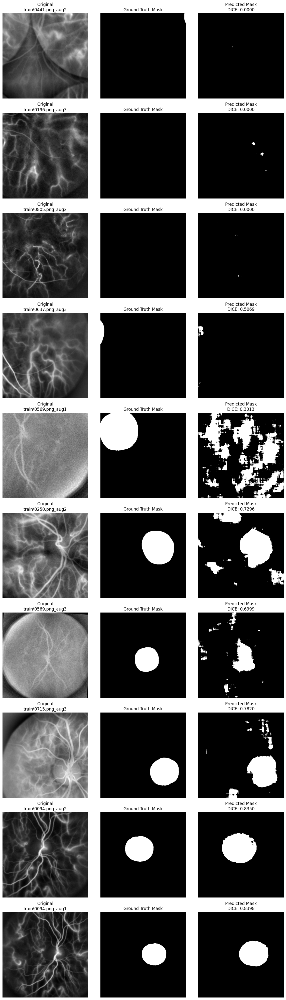

In [42]:
print("Worst samples paths:")
res_random_images_inference(worst_imgs, worst_masks, worst_paths, MODEL_PATH, device)

Best samples paths:


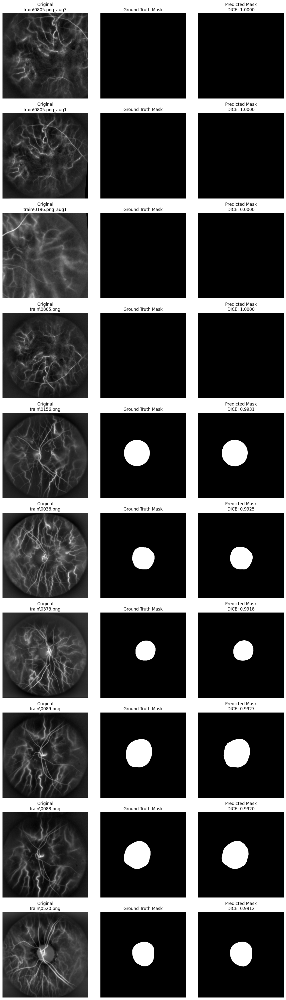

In [43]:
print("Best samples paths:")
res_random_images_inference(best_imgs, best_masks, best_paths, MODEL_PATH, device)

## Post-processing

### Connected

In [44]:
def keep_largest_convex_object(pred_mask: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """
    Keeps only the largest convex object from a grayscale prediction tensor.

    Args:
        pred_mask: torch.Tensor of shape [1, H, W] or [H, W], values in [0,1]
        threshold: threshold to binarize prediction

    Returns:
        torch.Tensor of shape [1, H, W] with only the largest convex object
    """
    # Ensure numpy array
    mask = pred_mask.squeeze().detach().cpu().numpy()

    # Threshold to binary
    binary = (mask > threshold).astype(np.uint8)

    if binary.sum() == 0:
        return torch.zeros_like(pred_mask)  # no object detected

    # Label connected components
    labeled = label(binary)
    regions = regionprops(labeled)

    if not regions:
        return torch.zeros_like(pred_mask)

    # Find largest connected component
    largest_region = max(regions, key=lambda r: r.area)
    largest_mask = (labeled == largest_region.label).astype(np.uint8)

    # Compute convex hull of the largest object
    convex_mask = convex_hull_image(largest_mask).astype(np.uint8)

    # Convert back to torch tensor
    convex_tensor = torch.from_numpy(convex_mask).unsqueeze(0).to(pred_mask.device).float()

    return convex_tensor

def keep_largest_smooth_convex(pred_mask: torch.Tensor, threshold=0.5, approx_epsilon=0.02):
    """
    Keep only the largest convex object with smooth approximation to avoid spikes.
    """
    mask = pred_mask.squeeze().detach().cpu().numpy()
    binary = (mask > threshold).astype(np.uint8)

    if binary.sum() == 0:
        return torch.zeros_like(pred_mask)

    # Label connected components
    labeled = label(binary)
    regions = regionprops(labeled)
    if not regions:
        return torch.zeros_like(pred_mask)

    # Largest connected component
    largest_region = max(regions, key=lambda r: r.area)
    largest_mask = (labeled == largest_region.label).astype(np.uint8)

    # Find contours
    contours, _ = cv2.findContours(largest_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return torch.zeros_like(pred_mask)

    # Approximate contour to remove small bumps
    contour = contours[0]
    epsilon = approx_epsilon * cv2.arcLength(contour, True)  # fraction of perimeter
    approx_contour = cv2.approxPolyDP(contour, epsilon, True)

    # Convex hull of approximated contour
    hull = cv2.convexHull(approx_contour)

    # Fill hull
    convex_mask = np.zeros_like(largest_mask)
    cv2.fillConvexPoly(convex_mask, hull, 1)

    return torch.from_numpy(convex_mask).unsqueeze(0).to(pred_mask.device).float()

def keep_largest_connected_object(pred_mask: torch.Tensor, threshold: float = 0.5) -> torch.Tensor:
    """
    Keep only the largest connected object from a grayscale prediction tensor.

    Args:
        pred_mask: torch.Tensor of shape [1,H,W] or [H,W], values in [0,1]
        threshold: threshold to binarize prediction

    Returns:
        torch.Tensor of shape [1,H,W] with only the largest connected object
    """
    # Convert to numpy
    mask = pred_mask.squeeze().detach().cpu().numpy()

    # Threshold to binary
    binary = (mask > threshold).astype(np.uint8)

    if binary.sum() == 0:
        return torch.zeros_like(pred_mask)  # no object detected

    # Label connected components
    labeled = label(binary)
    regions = regionprops(labeled)

    if not regions:
        return torch.zeros_like(pred_mask)

    # Keep only the largest region
    largest_region = max(regions, key=lambda r: r.area)
    largest_mask = (labeled == largest_region.label).astype(np.uint8)

    # Convert back to torch tensor
    return torch.from_numpy(largest_mask).unsqueeze(0).to(pred_mask.device).float()

Dice (raw prediction):     0.9820
Dice (largest convex obj): 0.9820


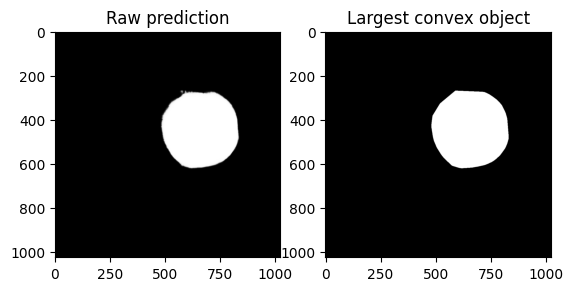

In [45]:
img, mask, _ = test_dataloader.dataset.__getitem__(0)

# Forward pass
with torch.no_grad():
    img = img.to(device)      # [1,1,H,W]
    mask = mask.to(device)    # ground truth [1,1,H,W]

    if img.dim() == 3:  # [C, H, W]
        img = img.unsqueeze(0)  # → [1, C, H, W]

    # Prediction
    y_pred = trained_model(img)
    y_pred_sigmoid = torch.sigmoid(y_pred)

    # Threshold raw prediction
    raw_mask = (y_pred_sigmoid[0] > 0.5).float()

    # Postprocessed convex mask
    convex_mask = keep_largest_convex_object(y_pred_sigmoid[0], threshold=0.5)

    # Dice scores
    dice_raw = dice(raw_mask, mask[0])
    dice_convex = dice(convex_mask, mask[0])

print(f"Dice (raw prediction):     {dice_raw:.4f}")
print(f"Dice (largest convex obj): {dice_convex:.4f}")

# Convert to numpy for visualization
plt.subplot(1,2,1)
plt.imshow(y_pred_sigmoid[0,0].cpu(), cmap="gray")
plt.title("Raw prediction")

plt.subplot(1,2,2)
plt.imshow(convex_mask[0].cpu(), cmap="gray")
plt.title("Largest convex object")
plt.show()


In [46]:
def get_best_worst_connected_samples(model, dataloaders, device, dice, n=10, threshold=0.5):
    """
    Compare Dice before and after connected postprocessing using keep_largest_connected_object.
    Returns the best and worst n examples (largest improvement vs largest drop).

    Each sample includes:
      - input image
      - ground truth mask
      - predicted mask
      - dice_raw
      - connected_predicted_mask
      - dice_connected
      - image path
    """
    model.eval()
    results = []  # list of dicts

    with torch.no_grad():
        for loader in dataloaders:
            for img, mask, paths in tqdm(loader, desc="Evaluating Connected Postprocess"):
                img = img.float().to(device)
                mask = mask.float().to(device)

                with autocast(device):
                    y_pred = model(img)

                # Iterate over batch images
                for b in range(img.size(0)):
                    # --- ground truth
                    gt = mask[b:b+1]

                    # --- raw pred
                    raw_pred = (y_pred[b:b+1] > threshold).float()
                    dice_raw = dice(raw_pred, gt.to(raw_pred.device)).item()

                    # --- connected postprocess using your function
                    connected_pred = keep_largest_connected_object(raw_pred, threshold=threshold)
                    dice_connected = dice(connected_pred, gt.to(connected_pred.device)).item()

                    # --- store sample
                    results.append({
                        "image": img[b].cpu(),
                        "mask_gt": gt.cpu(),
                        "pred_raw": raw_pred.cpu(),
                        "dice_raw": dice_raw,
                        "pred_connected": connected_pred.cpu(),
                        "dice_connected": dice_connected,
                        "path": paths[b],
                        "delta": dice_connected - dice_raw
                    })

    # sort by delta dice
    results_sorted = sorted(results, key=lambda x: x["delta"])

    # Worst n (biggest drops)
    worst_samples = results_sorted[:n]

    # Best n (biggest improvements)
    best_samples = results_sorted[-n:][::-1]

    return worst_samples, best_samples

In [47]:
def visualize_worst_best_samples(worst_samples, best_samples, n_per_row=4):
    """
    Visualize worst and best connected postprocessing samples.

    Each row shows: [Input, GT Mask, Raw Pred, Convex Pred]
    Worst samples are displayed first, then best samples.
    """
    all_samples = [("WORST", worst_samples), ("BEST", best_samples)]

    for label, samples in all_samples:
        n_samples = len(samples)
        plt.figure(figsize=(n_per_row*4, n_samples*4))
        plt.suptitle(f"{label} Samples (Connected Postprocessing)", fontsize=16)

        for i, sample in enumerate(samples):
            images_to_show = [
                (sample["image"].squeeze().cpu().numpy(), "Input Image"),
                (sample["mask_gt"].squeeze().cpu().numpy(), "GT Mask"),
                (sample["pred_raw"].squeeze().cpu().numpy(), f"Raw Pred\nDice: {sample['dice_raw']:.3f}"),
                (sample["pred_connected"].squeeze().cpu().numpy(), f"Connected Pred\nDice: {sample['dice_connected']:.3f}")
            ]

            for j, (img, title) in enumerate(images_to_show):
                plt.subplot(n_samples, n_per_row, i*n_per_row + j + 1)
                plt.imshow(img, cmap="gray")
                plt.title(title, fontsize=10)
                plt.axis("off")

        plt.tight_layout(rect=[0, 0, 1, 0.97])
        plt.show()

Evaluating Connected Postprocess: 100%|██████████| 41/41 [00:21<00:00,  1.94it/s]


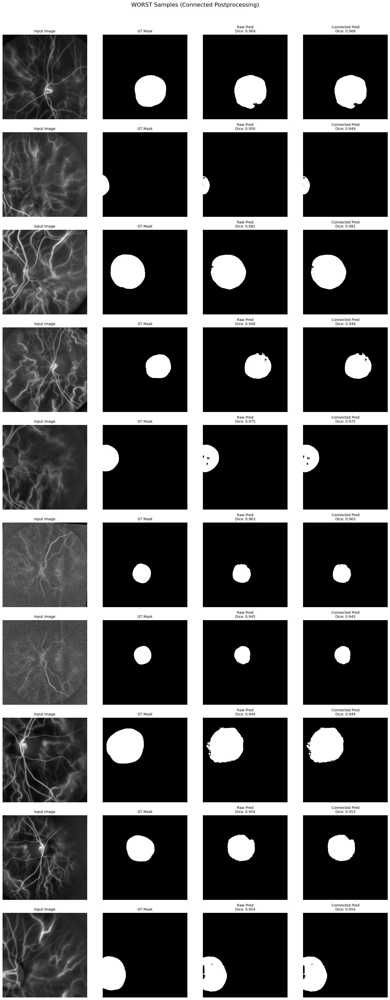

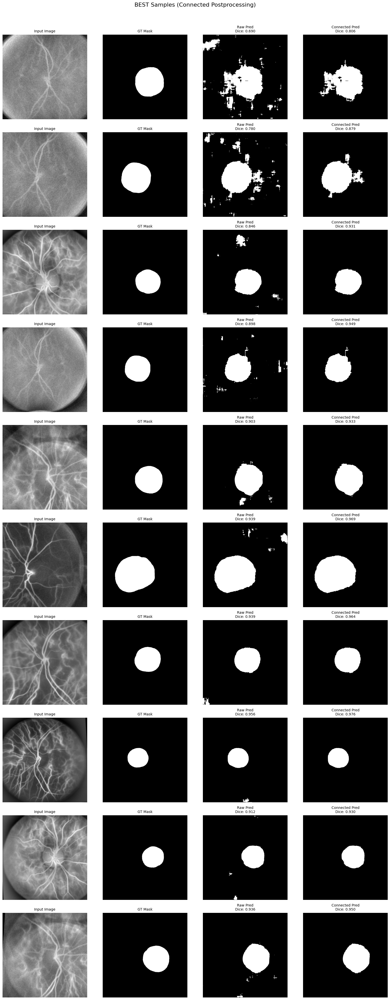

In [48]:
worst_samples, best_samples = get_best_worst_connected_samples(
    trained_model,
    [train_dataloader, val_dataloader, test_dataloader],
    device,
    dice,
    n=10,
    threshold=0.5
)

visualize_worst_best_samples(worst_samples, best_samples)

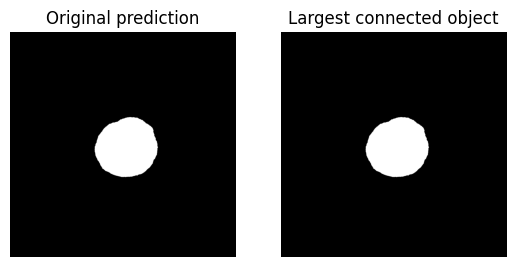

In [36]:
# grayscale prediction mask from model
pred_mask = raw_mask[0]  # shape [1,H,W]
largest_obj_mask = keep_largest_connected_object(pred_mask, threshold=0.5)

# visualize
plt.subplot(1,2,1)
plt.imshow(pred_mask.squeeze().cpu(), cmap="gray")
plt.title("Original prediction")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(largest_obj_mask.squeeze().cpu(), cmap="gray")
plt.title("Largest connected object")
plt.axis("off")
plt.show()

In [37]:
def eval_image(model, image_path: str, device: torch.device):
    """
    Forward pass on a single image and keep only the largest connected object.

    Args:
        model: trained PyTorch model
        image_path: path to the input image (str)
        device: torch.device ("cuda" or "cpu")

    Returns:
        torch.Tensor of shape [1,H,W] -> largest connected object mask
    """
    model.eval()

    # Preprocessing (same as your dataset)
    transform = transforms.Compose([
        transforms.Pad(padding=(0, 0, 1, 1)),  # because base image is 1023 x 1023
        transforms.Resize((1024, 1024)),
        transforms.ToTensor()
    ])

    # Load image
    img = Image.open(image_path).convert("L")
    img_tensor = transform(img).unsqueeze(0).to(device)  # add batch dim

    # Forward pass
    with torch.no_grad():
        pred = model(img_tensor)

    # Remove batch dimension -> shape [1,H,W]
    pred_mask = pred.squeeze(0)

    # Apply largest object filter
    largest_mask = keep_largest_connected_object(pred_mask, threshold=0.5)

    return largest_mask

In [45]:
def visualize_prediction(model, image_path: str, device):
    """
    Runs forward pass on an image, keeps only the largest connected object,
    and visualizes input vs. mask side by side.
    """
    # Predict
    mask = eval_image(model, image_path, device)

    # Reload the original image
    orig_img = Image.open(image_path).convert("L")

    # Plot side by side
    plt.figure(figsize=(8, 4))

    # Left: original image
    plt.subplot(1, 2, 1)
    plt.imshow(orig_img, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    # Right: predicted mask (largest object)
    plt.subplot(1, 2, 2)
    plt.imshow(mask.squeeze().cpu(), cmap="gray")
    plt.title("Largest Connected Object")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

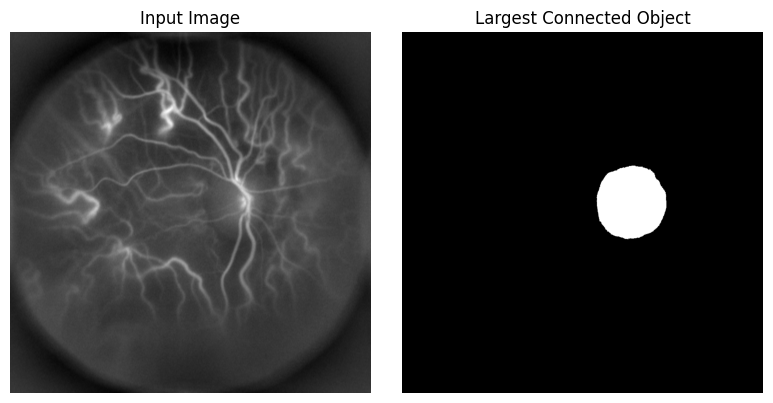

In [51]:
#mask = eval_image(trained_model, TRAIN_DIR + "0001.png", device)

visualize_prediction(trained_model, TRAIN_DIR + "0675.png", device)

In [ ]:
edge_cases = [
    195,
    196,
    197,
    201,
    212,
    250,
    258,
    282,
    289,
    351,
    368,
    369,
    370,
    371,
    382,
    402,
    403,
    404,
    414,
    415,
    417,
    418,
    419,
    436,
    441,
    462,
    463,
    464,
    514,
    525,
    526,
    527,
    528,
    529,
    530,
    531,
    532,
    533,
    534,
    535,
    536,
    537,
    569,
    570,
    571,
    585,
    595,
    596,
    597,
    680,
    683,
    715,
    733,
    735,
    736,
    737,
    738,
    739,
    740,
    748,
    751,
    767,

]